In [2]:
# import libraries

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from matplotlib.pyplot import figure

# Adjusts the configuration of the plots created

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (22,8) 

# read in the data

df = pd.read_csv(r'C:\Users\sprin\OneDrive\Desktop\SQL_SERVER\Portfolio\movies.csv')

In [3]:
# look at data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
budget_mean_value = df['budget'].mean()
df['budget'].fillna(budget_mean_value, inplace = True)
df['budget'] = df['budget'].astype('int64')

gross_mean_value = df['gross'].mean()
df['gross'].fillna(gross_mean_value, inplace = True)
df['gross'] = df['gross'].astype('int64')

# Replace empty data values in runtime with mean avg of column

runtime_mean_value = df['runtime'].mean()
df['runtime'].fillna(runtime_mean_value, inplace = True)

# Inputing missing votes values with 0.0

df.fillna({'votes':0.0}, inplace = True)
df['votes'] = df['votes'].astype('int64')

# Replace empty data values in ratings with NR

df['rating'] = df['rating'].fillna('NR')

# Replace empty data values in released with No Date

df['released'] = df['released'].fillna(0)

# Replace empty data values in writer with Unknown

df['writer'] = df['writer'].fillna('Unkown')

# Replace empty data values in star with None

df['star'] = df['star'].fillna('None')

# Replace empty data values in country with Unknown

df['country'] = df['country'].fillna('Unknown')

# Replace empty data values in company with Unknown

df['company'] = df['company'].fillna('Unknown')

# Replace empty data values in score with 0.0

df['score'] = df['score'].fillna(0.0)

In [26]:
# check to see if any data values are null

df.isnull().sum()


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,date_released,country_released
5445,533,6,0,2009,697,7.8,1100000,1155,1778,2335,55,237000000,2847246203,2253,162.000000,29,56
7445,535,6,0,2019,184,8.4,903000,162,743,2242,55,356000000,2797501328,1606,181.000000,39,56
3045,6896,6,6,1997,705,7.8,1100000,1155,1778,1595,55,200000000,2201647264,2253,194.000000,17,56
6663,5144,6,0,2015,699,7.8,876000,1125,2550,524,55,245000000,2069521700,1540,138.000000,35,56
7244,536,6,0,2018,193,8.4,897000,162,743,2242,55,321000000,2048359754,1606,149.000000,38,56
7480,6194,5,2,2019,1489,6.9,222000,1455,1919,676,55,260000000,1670727580,2317,118.000000,39,56
6653,2969,6,0,2015,1705,7.0,593000,517,3568,437,55,150000000,1670516444,2281,124.000000,35,56
6043,5502,6,0,2012,2473,8.0,1300000,1517,2314,2242,55,220000000,1518815515,1606,143.000000,32,56
6646,2145,6,0,2015,222,7.1,370000,1189,706,2722,55,190000000,1515341399,2281,137.000000,35,56
7494,2131,5,2,2019,2677,6.8,148000,432,1950,1527,55,150000000,1450026933,2316,103.000000,39,56


In [6]:
# Need to split the released column to seperate date and country

df['released'].str.split('(')

0          [June 13, 1980 , United States)]
1           [July 2, 1980 , United States)]
2          [June 20, 1980 , United States)]
3           [July 2, 1980 , United States)]
4          [July 25, 1980 , United States)]
                       ...                 
7663    [October 23, 2020 , United States)]
7664    [February 7, 2020 , United States)]
7665           [April 27, 2020 , Cameroon)]
7666     [October 1, 2020 , United States)]
7667     [August 19, 2020 , United States)]
Name: released, Length: 7668, dtype: object

In [7]:
# Now split the column into 2 columns date_released & country_released

df[['date_released', 'country_released']] = df['released'].str.split('(', expand = True)

# Remove the character ')'' closed parenthesis from country_released

df['country_released'] = df['country_released'].str.replace(')','')



C:\Users\sprin\AppData\Local\Temp\ipykernel_55596\3823154930.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['country_released'] = df['country_released'].str.replace(')','')


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,date_released,country_released
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.000000,"June 13, 1980",United States
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.000000,"July 2, 1980",United States
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.000000,"June 20, 1980",United States
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.000000,"July 2, 1980",United States
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.000000,"July 25, 1980",United States
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NR,Drama,2020,"October 23, 2020 (United States)",3.1,18,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000,78500541,Unknown,90.000000,"October 23, 2020",United States
7664,Dream Round,NR,Comedy,2020,"February 7, 2020 (United States)",4.7,36,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,35589876,78500541,Cactus Blue Entertainment,90.000000,"February 7, 2020",United States
7665,Saving Mbango,NR,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750,78500541,Embi Productions,107.261613,"April 27, 2020",Cameroon
7666,It's Just Us,NR,Drama,2020,"October 1, 2020 (United States)",0.0,0,James Randall,James Randall,Christina Roz,United States,15000,78500541,Unknown,120.000000,"October 1, 2020",United States


In [8]:
# Now we need to change the date_realeased to a date format from string to datetime

df['date_released'] = df['date_released'].astype('datetime64[ns]')

In [9]:
# Now we need to change the date format 
df['date_released'] = df['date_released'].dt.strftime('%Y')

In [10]:
df['date_released'].fillna(method="ffill")

0       1980
1       1980
2       1980
3       1980
4       1980
        ... 
7663    2020
7664    2020
7665    2020
7666    2020
7667    2020
Name: date_released, Length: 7668, dtype: object

In [11]:
df['date_released'].sort_values(ascending=False)

7667    2020
7651    2020
7584    2020
7462    2020
7604    2020
        ... 
65      1980
66      1980
0       1980
5728     NaN
5730     NaN
Name: date_released, Length: 7668, dtype: object

In [12]:
df['country_released'] = df['country_released'].fillna('Unknown')

In [13]:
# Drop Any Duplicates

df['company'].drop_duplicates().sort_values(ascending=False)

7129                                thefyzz
5664                            micro_scope
6412               iDeal Partners Film Fund
4007                               i5 Films
6793                             i am OTHER
                       ...                 
5813                        10 West Studios
3748                     1+2 Seisaku Iinkai
3024                        .406 Production
7525    "Weathering With You" Film Partners
4345        "DIA" Productions GmbH & Co. KG
Name: company, Length: 2386, dtype: object

In [14]:
# set max rows 

pd.set_option('Display.max_rows', None)

In [15]:
df = df.sort_values(by=['gross'], inplace=False, ascending=False)


In [16]:
df['company'].drop_duplicates().sort_values(ascending=False)

7129                                              thefyzz
5664                                          micro_scope
6412                             iDeal Partners Film Fund
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
524                             Zupnik-Curtis Enterprises
3330                          Zucker Brothers Productions
520                                      Zoetrope Studios
2213                                   Zeta Entertainment
6222                        Zentropa International Norway
3368                              Zentropa Entertainments
1175                                 Zenith Entertainment
5180                                      Zazen Produções
3193                                          ZapPictures
1321                             Zanuck/Brown Productions
1329          

In [17]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,date_released,country_released
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009,United States
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019,United States
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997,United States
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015,United States
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018,United States


In [18]:
df.dtypes

name                 object
rating               object
genre                object
year                  int64
released             object
score               float64
votes                 int64
director             object
writer               object
star                 object
country              object
budget                int64
gross                 int64
company              object
runtime             float64
date_released        object
country_released     object
dtype: object

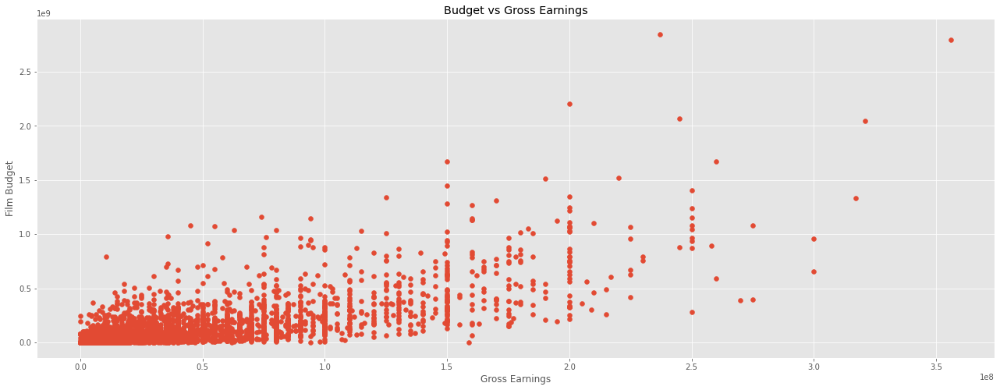

In [19]:
# Scatter plot to compare budget vs gross rev

plt.scatter(x=df['budget'], y=df['gross'])

plt.title('Budget vs Gross Earnings')

plt.xlabel('Gross Earnings')

plt.ylabel('Film Budget')

plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

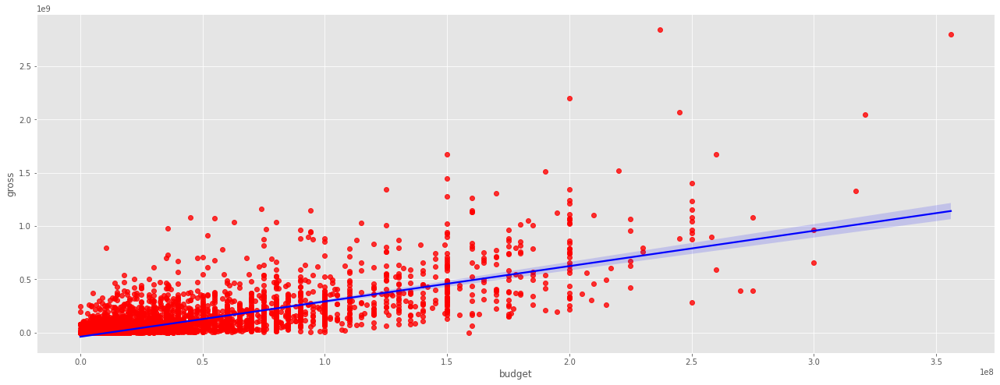

In [20]:
# Plot budget vs gross using regression in Seaborn

sns.regplot(x='budget', y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color": "blue"})

In [21]:
# Looking at correlation

df.corr(method='pearson') #pearson, kendall, spearman

,year,score,votes,budget,gross,runtime
year,1.000000,0.092616,0.222427,0.265578,0.252042,0.120766
score,0.092616,1.000000,0.407101,0.066569,0.181331,0.395549
votes,0.222427,0.407101,1.000000,0.421195,0.628677,0.309114
budget,0.265578,0.066569,0.421195,1.000000,0.711270,0.265287
gross,0.252042,0.181331,0.628677,0.711270,1.000000,0.241335
runtime,0.120766,0.395549,0.309114,0.265287,0.241335,1.000000


<function matplotlib.pyplot.show(close=None, block=None)>

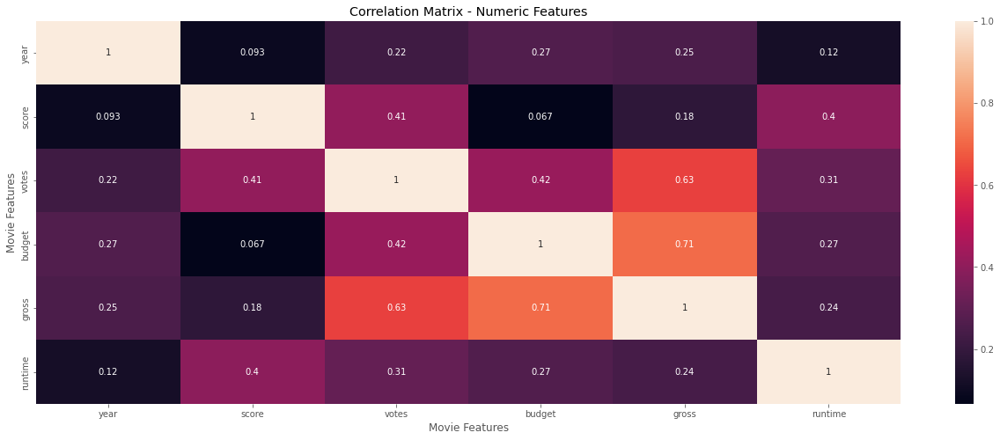

In [22]:
# Visualize correlation matrix

correlation_matrix = df.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix - Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')


plt.show

In [23]:
# Look at company vs gross

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,date_released,country_released
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009,United States
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019,United States
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997,United States
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015,United States
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018,United States


In [24]:
df_numerized = df

for col_name in df_numerized.columns:
        if(df_numerized[col_name].dtype == 'object'):
            df_numerized[col_name] = df_numerized[col_name].astype('category')
            df_numerized[col_name] = df_numerized[col_name].cat.codes
            
df_numerized.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,date_released,country_released
5445,533,6,0,2009,697,7.8,1100000,1155,1778,2335,55,237000000,2847246203,2253,162.000000,29,56
7445,535,6,0,2019,184,8.4,903000,162,743,2242,55,356000000,2797501328,1606,181.000000,39,56
3045,6896,6,6,1997,705,7.8,1100000,1155,1778,1595,55,200000000,2201647264,2253,194.000000,17,56
6663,5144,6,0,2015,699,7.8,876000,1125,2550,524,55,245000000,2069521700,1540,138.000000,35,56
7244,536,6,0,2018,193,8.4,897000,162,743,2242,55,321000000,2048359754,1606,149.000000,38,56
7480,6194,5,2,2019,1489,6.9,222000,1455,1919,676,55,260000000,1670727580,2317,118.000000,39,56
6653,2969,6,0,2015,1705,7.0,593000,517,3568,437,55,150000000,1670516444,2281,124.000000,35,56
6043,5502,6,0,2012,2473,8.0,1300000,1517,2314,2242,55,220000000,1518815515,1606,143.000000,32,56
6646,2145,6,0,2015,222,7.1,370000,1189,706,2722,55,190000000,1515341399,2281,137.000000,35,56
7494,2131,5,2,2019,2677,6.8,148000,432,1950,1527,55,150000000,1450026933,2316,103.000000,39,56


In [25]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,date_released,country_released
5445,533,6,0,2009,697,7.8,1100000,1155,1778,2335,55,237000000,2847246203,2253,162.0,29,56
7445,535,6,0,2019,184,8.4,903000,162,743,2242,55,356000000,2797501328,1606,181.0,39,56
3045,6896,6,6,1997,705,7.8,1100000,1155,1778,1595,55,200000000,2201647264,2253,194.0,17,56
6663,5144,6,0,2015,699,7.8,876000,1125,2550,524,55,245000000,2069521700,1540,138.0,35,56
7244,536,6,0,2018,193,8.4,897000,162,743,2242,55,321000000,2048359754,1606,149.0,38,56


<function matplotlib.pyplot.show(close=None, block=None)>

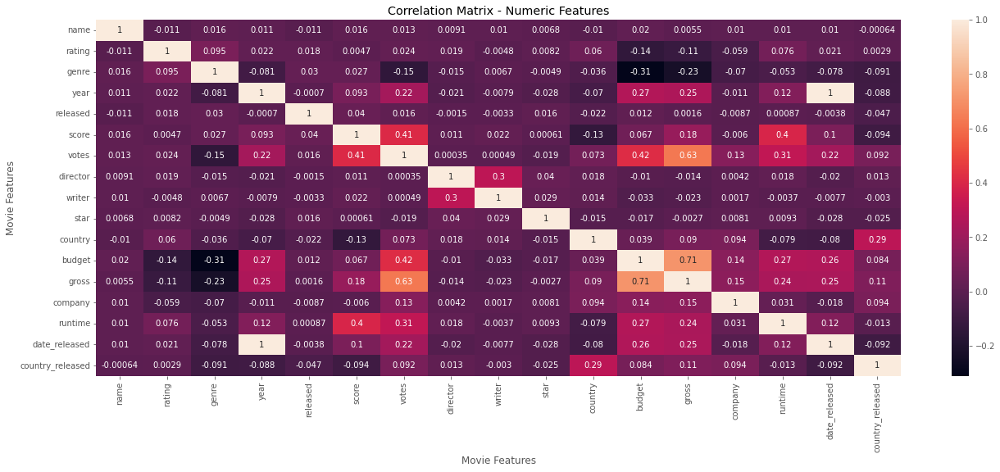

In [28]:
correlation_matrix = df_numerized.corr(method='pearson')

sns.heatmap(correlation_matrix, annot=True)

plt.title('Correlation Matrix - Numeric Features')

plt.xlabel('Movie Features')

plt.ylabel('Movie Features')


plt.show

In [30]:
df_numerized.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,date_released,country_released
name,1.000000,-0.011237,0.016355,0.011453,-0.011311,0.016377,0.013038,0.009079,0.009985,0.006750,-0.010359,0.020368,0.005466,0.010373,0.010390,0.010225,-0.000641
rating,-0.011237,1.000000,0.095126,0.022121,0.017524,0.004684,0.024117,0.019494,-0.004754,0.008241,0.059802,-0.138802,-0.114898,-0.059029,0.075520,0.020518,0.002894
genre,0.016355,0.095126,1.000000,-0.081261,0.029822,0.027384,-0.145296,-0.015258,0.006747,-0.004859,-0.035783,-0.310566,-0.230267,-0.070032,-0.052699,-0.078210,-0.090823
year,0.011453,0.022121,-0.081261,1.000000,-0.000695,0.092616,0.222427,-0.020795,-0.007930,-0.027750,-0.069590,0.265578,0.252042,-0.011425,0.120766,0.996397,-0.088478
released,-0.011311,0.017524,0.029822,-0.000695,1.000000,0.039814,0.015878,-0.001478,-0.003326,0.015538,-0.022160,0.012263,0.001636,-0.008722,0.000867,-0.003775,-0.046685
score,0.016377,0.004684,0.027384,0.092616,0.039814,1.000000,0.407101,0.010568,0.022475,0.000608,-0.134439,0.066569,0.181331,-0.005964,0.395549,0.100897,-0.094076
votes,0.013038,0.024117,-0.145296,0.222427,0.015878,0.407101,1.000000,0.000349,0.000487,-0.019320,0.073424,0.421195,0.628677,0.130535,0.309114,0.217782,0.092275
director,0.009079,0.019494,-0.015258,-0.020795,-0.001478,0.010568,0.000349,1.000000,0.299523,0.039716,0.018014,-0.010364,-0.014272,0.004248,0.017624,-0.020385,0.013318
writer,0.009985,-0.004754,0.006747,-0.007930,-0.003326,0.022475,0.000487,0.299523,1.000000,0.028722,0.014490,-0.033223,-0.023192,0.001729,-0.003692,-0.007653,-0.002989
star,0.006750,0.008241,-0.004859,-0.027750,0.015538,0.000608,-0.019320,0.039716,0.028722,1.000000,-0.014781,-0.016950,-0.002676,0.008056,0.009270,-0.028120,-0.024916


In [31]:
correlation_mat = df_numerized.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name              name                1.000000
                  rating             -0.011237
                  genre               0.016355
                  year                0.011453
                  released           -0.011311
                  score               0.016377
                  votes               0.013038
                  director            0.009079
                  writer              0.009985
                  star                0.006750
                  country            -0.010359
                  budget              0.020368
                  gross               0.005466
                  company             0.010373
                  runtime             0.010390
                  date_released       0.010225
                  country_released   -0.000641
rating            name               -0.011237
                  rating              1.000000
                  genre               0.095126
                  year                0.022121
             

In [33]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

budget            genre              -0.310566
genre             budget             -0.310566
gross             genre              -0.230267
genre             gross              -0.230267
                  votes              -0.145296
votes             genre              -0.145296
budget            rating             -0.138802
rating            budget             -0.138802
country           score              -0.134439
score             country            -0.134439
rating            gross              -0.114898
gross             rating             -0.114898
country_released  score              -0.094076
score             country_released   -0.094076
country_released  date_released      -0.091557
date_released     country_released   -0.091557
country_released  genre              -0.090823
genre             country_released   -0.090823
country_released  year               -0.088478
year              country_released   -0.088478
                  genre              -0.081261
genre        

In [34]:
high_corr = sorted_pairs[(sorted_pairs) > .5]

high_corr

votes             gross               0.628677
gross             votes               0.628677
budget            gross               0.711270
gross             budget              0.711270
year              date_released       0.996397
date_released     year                0.996397
name              name                1.000000
writer            writer              1.000000
runtime           runtime             1.000000
company           company             1.000000
gross             gross               1.000000
budget            budget              1.000000
country           country             1.000000
star              star                1.000000
director          director            1.000000
votes             votes               1.000000
score             score               1.000000
released          released            1.000000
year              year                1.000000
genre             genre               1.000000
rating            rating              1.000000
date_released

In [ ]:
# Votes and Budget have strong correlation to gross revenue
# Company has no impact 